# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Opening a new Crepe shop in Doha , Qatar.

## Introduction: Business Problem

In this project we aim to explore the idea of opening a new Crepes&Waffles shop in Doha,Qatar .Followed by recommendation of  the best location for it . Specifically, this report will be targeted to Crepeaholic chain that already has presence in Amman,Jordan and Abu Dhabi,UAE .I am a fan of this place and I personally know the owner . I suggested him the idea of the project and its expected outcomes . He is excited to extend the view and have some insights & observations.

First , we would like to research the the demographics and financials aspects of Qatar and Doha in particular .
pursued by analysis of market growth (Resturants/cafes count during time) .if possible ,with intention to investigate the question of how many resturants/cafes were opened and closed in a short period of time .


Since there are lots of restaurants&cafes in Doha, we will try to detect locations that are not already crowded with restaurants/cafes but crowded with people. and as per the owner ; the focus shall be on family oriented areas and with a preference of a community aged between 16-35 years old .
We are also particularly interested in areas with no or few desserts&Cafe shops in vicinity. We would also prefer locations as close to city center as possible, considering all other conditions are met .


## Data

Based on definition of our business case, factors that will influence our decission are:

* Number of current restaurants/cafes in Doha and each Neighborhood.
* A time series that shows the growth of resturants/cafes In Doha and specifically the targeted kind of shops.
* Demographics of each neighborhood .
* investigate the number of resturants and cafes that were opened and closed in the period of  2017-2021.
* Distance of neighborhood from city center.
* Top 5 venue categories in each neighboorhood and its corrosponded average customer review rates 



Data Needed  :


* List of Doha's Neighborhoods.
* Demographics tables about Doha .
* Foursquare API location data.
* If available , customer reviews and rates for each venue in Foursquare  data. 
* If available , foot traffic and check-ins details . 
* Financial details of Qatar and Doha. 






import the required libraries for now

In [1]:
import pandas as pd 
import numpy as np


Scraping the table data "Neighborhoods in Doha,Qatar" from the Wikipedia page and determine the size of it .

In [2]:
df=pd.read_html('https://en.wikipedia.org/wiki/Zones_of_Qatar#Ad_Dawhah_Municipality')[2]
df.head(10)

,Zone no.,Districts,Area (km²),Population (2015)
0,1,Al Jasrah,0.4,240 (2010)[6]
1,2,Al Bidda,NaN,35 (2010)[6]
2,3,Fereej Mohamed Bin Jasim Mushayrib,NaN,"4,886 (2010)[6]"
3,4,Mushayrib,0.3,9791
4,5,Al Najada Barahat Al Jufairi Fereej Al Asmakh,0.2,2086
5,6,Old Al Ghanim,0.3,1124
6,7,Al Souq,0.3,297
7,10,Wadi Al Sail,NaN,8 (2010)[6]
8,11,Rumeilah,NaN,63 (2010)[6]
9,12,Al Bidda,NaN,"1,067 (2010)[6]"


After Examining the available raw data , these points were noticed : 
1. The data consists of columns : Zone #, District or neighborhood, Area ,and corresponded Population.
2. Data extracted from Wikipedia but the reference is a report from Ministry of development planning and statistics in Qatar.
3. Data originally has  56 neighborhoods/districts. 
4. Some population values are based on old report in 2010 .by observing these values , we can see they represent a very minimal out of total .Thus , we may remove these rows for the sake of our study .
5. Last row represents the total for all Doha and we may drop it .
6. some districts columns have more than one neighborhoods.





##### Data Manipulation to make the required changes in the data 

In [3]:
# Rename columns 
df.rename(columns={'Districts':'Neighborhood'},inplace=True)
df.rename(columns={'Population (2015)':'Population'},inplace=True)


In [4]:
# dropping Zone no. column
df.drop(['Zone no.'],axis=1,inplace=True)
df

,Neighborhood,Area (km²),Population
0,Al Jasrah,0.4,240 (2010)[6]
1,Al Bidda,NaN,35 (2010)[6]
2,Fereej Mohamed Bin Jasim Mushayrib,NaN,"4,886 (2010)[6]"
3,Mushayrib,0.3,9791
4,Al Najada Barahat Al Jufairi Fereej Al Asmakh,0.2,2086
5,Old Al Ghanim,0.3,1124
6,Al Souq,0.3,297
7,Wadi Al Sail,NaN,8 (2010)[6]
8,Rumeilah,NaN,63 (2010)[6]
9,Al Bidda,NaN,"1,067 (2010)[6]"


In [5]:
# dropping the total row 
df.drop([56],axis=0,inplace=True)


In [6]:
# dropping 2010 data 
df=df[df['Population'].str.contains("2010")==False]


In [7]:
df.reset_index(inplace=True,drop=True)


In [8]:
df.dtypes

Neighborhood     object
Area (km²)      float64
Population       object
dtype: object

Changing population data type to Integer

In [9]:
df['Population']= df['Population'].astype(int)

<ipython-input-9-e02ec9385d6e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Population']= df['Population'].astype(int)


it was noticed that there are duplicates in the Neighborhood column but it has different population and areas . 
We will assume that each row of them is a part of total , therefore we will group them based on Neighborhoods .


In [10]:
df=df.groupby('Neighborhood').sum()

In [11]:
df.reset_index(inplace=True)

as we have amended the data as per the required form , that study will be done on  41 distinct Neighborhoods in Doha,Qatar

In [12]:
df

,Neighborhood,Area (km²),Population
0,Ad Dawhah al Jadidah,0.5,15920
1,Al Dafna Al Qassar,4.0,4022
2,Al Hilal,1.8,11671
3,Al Khulaifat Ras Abu Aboud,0.9,1731
4,Al Markhiya,2.7,6242
5,Al Messila,2.1,6803
6,Al Najada Barahat Al Jufairi Fereej Al Asmakh,0.2,2086
7,Al Rufaa Old Al Hitmi,0.4,6026
8,Al Sadd,3.5,17820
9,Al Sadd New Al Mirqab Fereej Al Nasr,2.7,23853


Adding new columns for Population density, Longitude and latitude

In [13]:
df['Population Density']=None
df['Latitude']=None
df['Longitude']=None
df['Population Density']=df.Population/df['Area (km²)']
df['Population Density']=df['Population Density'].astype(int)

df_sorted= df.sort_values(by='Population Density',ascending=False)

Visualization of the population density per Neighborhood in Descending order.

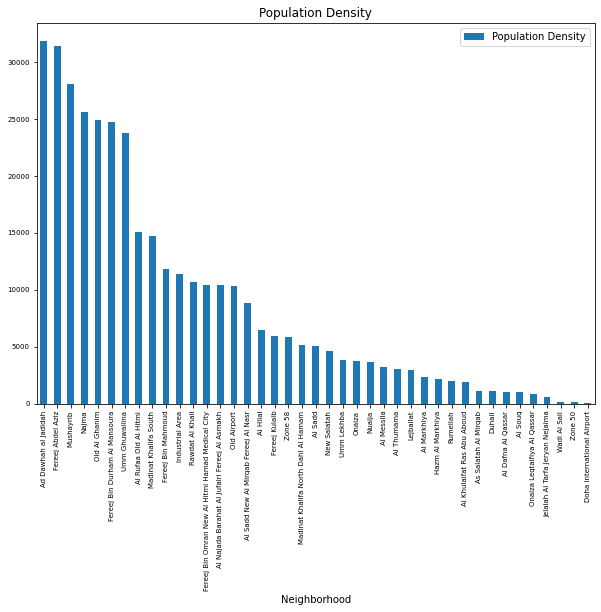

In [14]:

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


df_sorted.plot.bar(x='Neighborhood', y="Population Density", rot=90, title="Population Density", figsize=(10,7), fontsize=(7
                                                                                                           ))
plt.show()

##### Installing and importing the required libraries 

In [15]:
!pip install geopy
!pip install geocoder
!pip install folium

In [17]:
import json
from geopy.geocoders import Nominatim
import geocoder
import requests
import matplotlib.cm as cm

from sklearn.cluster import KMeans
import folium

import seaborn as sns
from pandas.io.json import json_normalize
from sklearn.metrics import silhouette_score
import requests

%matplotlib notebook

print('All libraries imported.')

All libraries imported.


Using Geocoder , we will bring the latitude and longitude for each of the neighborhoods


In [20]:
for i, neigh in enumerate(df['Neighborhood']):
    lat_lng_coords = None
    
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Doha, Qatar'.format(neigh))
        lat_lng_coords = g.latlng
    
    if lat_lng_coords:
        latitude = lat_lng_coords[0]
        longitude = lat_lng_coords[1]
    
    df.loc[i, 'Latitude'] = latitude
    df.loc[i, 'Longitude'] = longitude

In [27]:
df.reset_index(drop="yes")
df

,Neighborhood,Area (km²),Population,Population Density,Latitude,Longitude
0,Ad Dawhah al Jadidah,0.5,15920,31840,25.2758,51.5336
1,Al Dafna Al Qassar,4.0,4022,1005,25.3122,51.5194
2,Al Hilal,1.8,11671,6483,25.2593,51.542
3,Al Khulaifat Ras Abu Aboud,0.9,1731,1923,25.2843,51.5545
4,Al Markhiya,2.7,6242,2311,25.3242,51.4891
5,Al Messila,2.1,6803,3239,25.3034,51.4881
6,Al Najada Barahat Al Jufairi Fereej Al Asmakh,0.2,2086,10430,25.2848,51.5336
7,Al Rufaa Old Al Hitmi,0.4,6026,15065,25.284,51.5478
8,Al Sadd,3.5,17820,5091,25.2816,51.5008
9,Al Sadd New Al Mirqab Fereej Al Nasr,2.7,23853,8834,25.2694,51.4962


Visualization the neighborhoods in the map .

In [28]:
Map_Doha = folium.Map(location=[latitude, longitude], zoom_start=12)

for lat, lng, neighborhood in zip(df['Latitude'], df['Longitude'], df['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Map_Doha)  
    
Map_Doha

Identify the FourSquare credentials

In [29]:
# Personalized FOURSQUARE Credentials here
CLIENT_ID = 'ASW3CV1KARXMO54QIDQE3TYMFWMSWD4N4HWZAURXYDBGWB2C'
CLIENT_SECRET = 'AA1SH3ELZ1X0S40ZNSKZYFEH2ZRCMHMXYVQ5JLX1XFR4UA5V'
VERSION = '20210530'

Create a function to process all neighborhoods to get their nearby venues.

In [30]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    LIMIT = 50
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [31]:
venues_2021 = getNearbyVenues(names=df['Neighborhood'], latitudes=df['Latitude'], longitudes=df['Longitude'])

Ad Dawhah al Jadidah
Al Dafna Al Qassar
Al Hilal
Al Khulaifat Ras Abu Aboud
Al Markhiya
Al Messila
Al Najada Barahat Al Jufairi Fereej Al Asmakh
Al Rufaa Old Al Hitmi
Al Sadd
Al Sadd New Al Mirqab Fereej Al Nasr
Al Souq
Al Thumama
As Salatah Al Mirqab
Doha International Airport
Duhail
Fereej Abdel Aziz
Fereej Bin Durham Al Mansoura
Fereej Bin Mahmoud
Fereej Bin Omran New Al Hitmi Hamad Medical City
Fereej Kulaib
Hazm Al Markhiya
Industrial Area
Jelaiah Al Tarfa Jeryan Nejaima
Lejbailat
Madinat Khalifa North Dahl Al Hamam
Madinat Khalifa South
Mushayrib
Najma
New Salatah
Nuaija
Old Airport
Old Al Ghanim
Onaiza
Onaiza Leqtaifiya Al Qassar
Rawdat Al Khail
Rumeilah
Umm Ghuwailina
Umm Lekhba
Wadi Al Sail
Zone 50
Zone 58


Let's view the venues list extracted 

In [35]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
venues_2021.head(5)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Ad Dawhah al Jadidah,25.27583,51.53361,sealine beach,25.273369,51.530212,Beach
1,Ad Dawhah al Jadidah,25.27583,51.53361,Mashweyat Lamazani Kebab,25.279934,51.536991,BBQ Joint
2,Ad Dawhah al Jadidah,25.27583,51.53361,Meesh Me-Time Cafe,25.273987,51.541470,Café
3,Ad Dawhah al Jadidah,25.27583,51.53361,Kebab King,25.275301,51.539706,Indian Restaurant
4,Ad Dawhah al Jadidah,25.27583,51.53361,City Gym,25.275131,51.537954,Gym


As we have taken the exploration radius as 1 KM ,some neighborhoods might intefere in each other area boundries . 
Thus , we have to remove the duplicates venues that appear in various neighborhoods .

In [ ]:
venues_2021.drop_duplicates(subset=["Venue","Venue Latitude","Venue Longitude"],keep='first',inplace=True)
venues_2021.shape

In [ ]:
venues_2021_count=pd.DataFrame(venues_2021['Neighborhood'].value_counts())
venues_2021_count.reset_index(inplace=True)
venues_2021_count.rename(columns={'index':'Neighborhood','Neighborhood':'# of venues'},inplace=True)
venues_2021_count

Now let's examine the numbers of venues per category .

In [36]:
venues_categories_2021=pd.DataFrame(venues_2021['Venue Category'].value_counts())
venues_categories_2021

,Venue Category
Café,129
Hotel,112
Middle Eastern Restaurant,83
Coffee Shop,57
Indian Restaurant,48
Restaurant,46
Fast Food Restaurant,41
Asian Restaurant,32
Pizza Place,26
Department Store,25


We can observe that Cafes , Resturants and hotels have the biggest presence in Doha.


###### In order to have a deeper understanding of Doha market .  It was my intention to extract historical location data from FourSquare API and analyze the growth of targeted category of venues in each neighborhood .Also ,to Determine if there were shops that opened and closed during the last 5 years . Unfortunately , FourSquare API gives instant location data and it can't go backward with time . 




After viewing the venues categories , we would like to focus in our targeted category (Dessert and Cupcake shops)

In [37]:
Targeted_categories=['Dessert Shop','Cupcake Shop']
Dessert_shops=venues_2021[venues_2021['Venue Category'].isin(Targeted_categories)]

In [38]:
Dessert_shops.reset_index(inplace=True,drop="yes")

In [39]:
Dessert_shops

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Al Dafna Al Qassar,25.31216,51.519350,minis,25.316598,51.513110,Dessert Shop
1,Al Najada Barahat Al Jufairi Fereej Al Asmakh,25.28482,51.533620,حلويات العكر,25.286898,51.532861,Dessert Shop
2,Al Sadd,25.28162,51.500820,Opera Patisserie,25.280603,51.498354,Dessert Shop
3,Al Sadd New Al Mirqab Fereej Al Nasr,25.26944,51.496170,Al Aker Sweets (حلويات العكر),25.263104,51.496219,Dessert Shop
4,Al Souq,25.28887,51.537320,حلويات العكر,25.286898,51.532861,Dessert Shop
5,As Salatah Al Mirqab,25.28950,51.541990,حلويات العكر,25.286898,51.532861,Dessert Shop
6,Duhail,25.34951,51.466890,Fruit Licious,25.348690,51.457342,Dessert Shop
7,Fereej Abdel Aziz,25.27631,51.526870,Habibah Sweets,25.272185,51.526387,Dessert Shop
8,Hazm Al Markhiya,25.33504,51.494480,Läderach,25.331309,51.497985,Dessert Shop
9,Hazm Al Markhiya,25.33504,51.494480,La princesse,25.334913,51.488891,Cupcake Shop


In [40]:
Dessert_shops_count= pd.DataFrame(Dessert_shops['Neighborhood'].value_counts())
Dessert_shops_count=Dessert_shops_count.reset_index()


In [41]:
Dessert_shops_count.rename(columns={'index':'Neighborhood','Neighborhood':'Dessert shops count'},inplace=True)
Dessert_shops_count

,Neighborhood,Dessert shops count
0,Onaiza Leqtaifiya Al Qassar,4
1,Hazm Al Markhiya,2
2,Zone 50,1
3,Old Airport,1
4,Zone 58,1
5,Al Dafna Al Qassar,1
6,Duhail,1
7,Al Souq,1
8,Fereej Abdel Aziz,1
9,Al Sadd,1


As per the FourSquare API , we have 19 venues Similar to our the targeted shop .

Now , let's analyze the neighborhoods deeper to know what are the most common venues in the area and the count of each .

Get the dummies data of venues  for each neighborhood

In [42]:
Venues_onehot= pd.get_dummies(venues_2021[['Venue Category']],prefix="",prefix_sep="")
Venues_onehot

,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Garden,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Building,Burger Joint,Business Service,Cafeteria,Café,Candy Store,Caribbean Restaurant,Castle,Chaat Place,Chinese Restaurant,Chocolate Shop,Clothing Store,Coffee Shop,Convenience Store,Cosmetics Shop,Costume Shop,Cupcake Shop,Currency Exchange,Department Store,Dessert Shop,Diner,Donut Shop,Egyptian Restaurant,Electronics Store,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,General Entertainment,Gift Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Health & Beauty Service,Historic Site,Home Service,Hookah Bar,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kebab Restaurant,Korean Restaurant,Lebanese Restaurant,Lounge,Malay Restaurant,Market,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Other Repair Shop,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Perfume Shop,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Rental Car Location,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Shawarma Place,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Snack Place,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Steakhouse,Supermarket,Sushi Restaurant,Tea Room,Tennis Court,Tennis Stadium,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Toy / Game Store,Track,Trail,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Volleyball Court,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

Adding neighborhood column as first column in the resultant DataFrame

In [43]:
Venues_onehot['Neighborhood'] = venues_2021['Neighborhood']

temp = list(Venues_onehot.columns)

if 'Neighborhood' in temp:
    temp.remove('Neighborhood')
    
fixed_columns = ['Neighborhood'] + temp
Venues_onehot = Venues_onehot[fixed_columns]

Venues_onehot.head(10)

,Neighborhood,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Garden,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Building,Burger Joint,Business Service,Cafeteria,Café,Candy Store,Caribbean Restaurant,Castle,Chaat Place,Chinese Restaurant,Chocolate Shop,Clothing Store,Coffee Shop,Convenience Store,Cosmetics Shop,Costume Shop,Cupcake Shop,Currency Exchange,Department Store,Dessert Shop,Diner,Donut Shop,Egyptian Restaurant,Electronics Store,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,General Entertainment,Gift Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Health & Beauty Service,Historic Site,Home Service,Hookah Bar,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kebab Restaurant,Korean Restaurant,Lebanese Restaurant,Lounge,Malay Restaurant,Market,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Other Repair Shop,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Perfume Shop,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Rental Car Location,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Shawarma Place,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Snack Place,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Steakhouse,Supermarket,Sushi Restaurant,Tea Room,Tennis Court,Tennis Stadium,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Toy / Game Store,Track,Trail,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Volleyball Court,Women's Store
0,Ad Dawhah al Jadidah,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Ad Dawhah al Jadidah,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Ad Dawhah al Jadidah,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Ad Dawhah al Jadidah,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Ad Dawhah al Jadidah,0,0,0,0,0,0,0,0,

Group by the neighborhood and take the averages for the categories 

In [ ]:
venues_grouped = Venues_onehot.groupby('Neighborhood', sort=False).mean().reset_index()
print(venues_grouped.shape)
venues_grouped

In [ ]:
num_top_venues = 5

for hood in venues_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = venues_grouped[venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

### Most common venues for each neighborhood

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [ ]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = venues_grouped['Neighborhood']

for ind in np.arange(venues_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(venues_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

### Cluster neighborhoods by using K means

In [ ]:
from sklearn.cluster import KMeans

First we need to add new variables that are required to be considered while clustering process :
1. Population .
2. Population density.
3. Number of venues.


Let's prepare the final DataFrame to be used in clustering 

In [ ]:
df_clustering=pd.merge(venues_grouped,df,on="Neighborhood",how="left")
df_clustering=pd.merge(df_clustering,venues_2021_count,on="Neighborhood",how="left")
df_clustering.drop(['Area (km²)', 'Latitude','Longitude'], axis='columns', inplace=True)
# Let's drop the neighborhood categorical variable to make the DataFrame all numerical
df_clustering.drop(['Neighborhood'],axis=1,inplace=True)
df_clustering

Now let's normalize the dataset. Normalization is a statistical method that helps mathematical-based algorithms to interpret features with different magnitudes and distributions equally. We use StandardScaler() to normalize our dataset.

In [ ]:
from sklearn.preprocessing import StandardScaler
X = df_clustering.values[:,1:]

Clus_dataSet_X = StandardScaler().fit_transform(X)

Clus_dataSet_X

# Modeling

In [ ]:

k = 3
k_means = KMeans(init = "k-means++", n_clusters = k,n_init=12)
k_means.fit(Clus_dataSet_X)
labels = k_means.labels_
print(labels)

In [ ]:
neighborhoods_venues_sorted['Cluster/Group']=labels

In [ ]:
needed_columns=pd.merge(df,venues_2021_count,on="Neighborhood",how="left")

In [ ]:
needed_columns=needed_columns.drop(['Area (km²)'],axis=1)


In [ ]:
FINAL_DF=pd.merge(neighborhoods_venues_sorted,needed_columns,on="Neighborhood",how="left")

Arrange the final Output Table

In [ ]:
cols_to_order = ['Neighborhood','# of venues','Cluster/Group','Population','Population Density']
new_columns = cols_to_order + (FINAL_DF.columns.drop(cols_to_order).tolist())
FINAL_DF = FINAL_DF[new_columns]
FINAL_DF['# of venues']=FINAL_DF['# of venues'].astype(int)
FINAL_DF['Cluster/Group']=FINAL_DF['Cluster/Group']+1

FINAL_DF=FINAL_DF.sort_values(['Cluster/Group','Population Density','# of venues'],ascending=False)

In [ ]:
FINAL_DF

In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as colors

map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster,population_density,venues_count in zip(FINAL_DF['Latitude'], FINAL_DF['Longitude'], FINAL_DF['Neighborhood'], FINAL_DF['Cluster/Group'],FINAL_DF['Population Density'],FINAL_DF['# of venues']):
    label = folium.Popup(str(poi) + ' cluster ' + str(cluster) +' Population Density '+str(population_density)+' Count of venues '+str(venues_count) , parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

To look for the bigger picture ,  Let's bring back the dessert shop count table 

In [ ]:
Dessert_shops_count

# Conclusion

##### We have successfully analyzed the neighborhoods in Doha, Qatar for determining which would be the best neighborhoods for opening a new dessert shop. We have considered in our decision the location data and some demographics about the city . We have plotted  the neighborhoods and its corrosponded info in the map above . By looking into map in conjuction with the current dessert_shops list , It was noticed that most Dessert shops are located in the north and west of Doha . interestingly ,these locations aren't the most populated ones . Therefore , I see a great opportunity to locate a new dessert shop near the port in the city centre . This area is highly densed populated area having a lot venues and malls(which's a sign of good traffic ) but not dessert (crepe and waffles) shops . The Industrial area is highly populated and has no dessert shops but I eliminated it as it's unlikely for dessert shops to work successfully in such areas . 

#### The optimal neighborhoods would be :

1. Ad Dawhah al Jadidah --- as it's the centriod of other populated neighborhoods and it seems easier to reach .
2. Old Al Ghanim

